In [1]:
# Packages
import scanpy as sc
import squidpy as sq
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib
import scipy.sparse
import matplotlib.pyplot as plt

from matplotlib import rcParams
# Need for benchmarking clustering res
from sklearn.metrics import silhouette_score

# Settings
sc.settings.set_figure_params(dpi=80, facecolor="white")
rcParams['pdf.fonttype'] = 42
rcParams['figure.figsize'] = 6,6

Read in data

In [2]:
adata = sc.read_h5ad('/project/data/gew123/Spatial/Annotated_objects/spatial_annotated_final.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 182735 × 1000
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'tissue', 'section', 'subtype', 'stage', 'cell_ID', 'fine_annotations', 'broad_annotations', 'cat_annotations', 'leiden_30_0.7'
    var: 'NegPrb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'c2l_predicted_colors', 'fine_annotations_colors', 'grouped_annotations_colors', 'leiden', 'leiden_30_0.7_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'tissue_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_fov'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


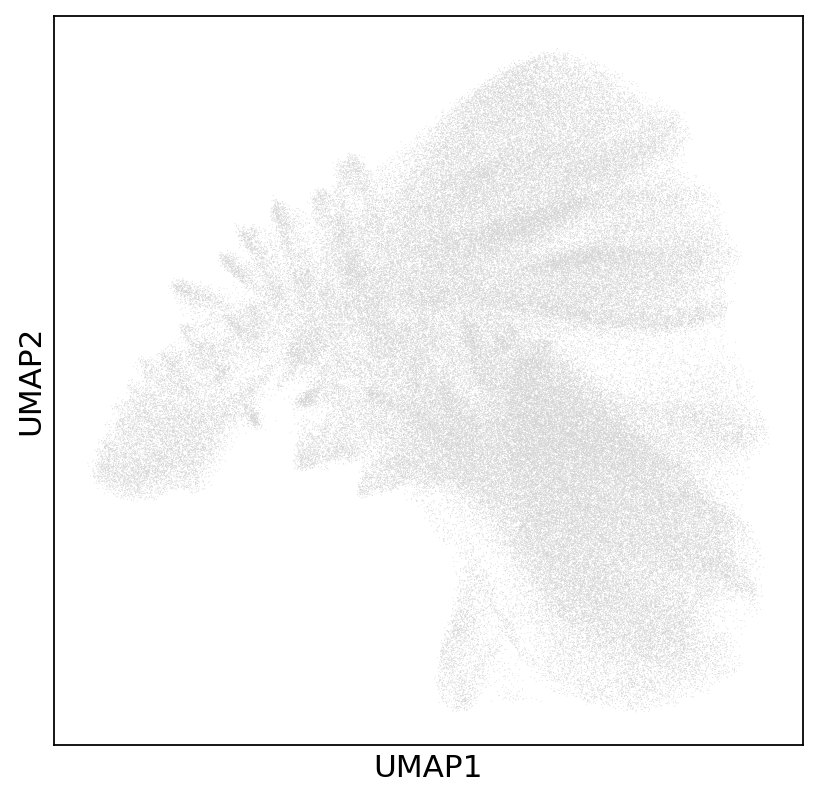

In [4]:
sc.pl.umap(adata)

Run clustering

In [7]:
adata

AnnData object with n_obs × n_vars = 182735 × 1000
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'tissue', 'section', 'subtype', 'stage', 'cell_ID', 'fine_annotations', 'broad_annotations', 'cat_annotations', 'leiden_30_0.7', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4'
    var: 'NegPrb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'c2l_predicted_colors', 'fine_annotations_colors', 'grouped_annotations_colors', 'leiden', 'leiden_30_0.7_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'tissue_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_fov'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [8]:
# Try on clustering for all leiden resolutions
resolutions = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
clusterings = {}

for i in resolutions:
    print('Clustering at resolution:', i, '.....')
    sc.tl.leiden(adata, key_added=f'leiden_{i}', resolution=i)
    clusterings[i] = adata.obs[f'leiden_{i}'].copy()
    print('Done')

# Convert to list
labels = []
for i in clusterings.keys():
    labels.append(f'leiden_{i}')
    
# Save
adata.write('/project/data/gew123/Spatial/Annotated_objects/spatial_manual_annotation_inprogress.h5ad')

Clustering at resolution: 0.5 .....
Done
Clustering at resolution: 0.6 .....
Done
Clustering at resolution: 0.7 .....
Done
Clustering at resolution: 0.8 .....
Done
Clustering at resolution: 0.9 .....
Done


Calculate ASW scores

In [ ]:
adata = sc.read_h5ad('/project/data/gew123/Spatial/Annotated_objects/spatial_manual_annotation_inprogress.h5ad')

In [ ]:
# Calculate
resolutions = [0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
# Convert to list
labels = []
for i in resolutions:
    labels.append(f'leiden_{i}')

#scores = {}
for i in labels:
    print(f'Calculating ASW for {i}')
    assignments = adata.obs[i]
    asw_score = silhouette_score(adata.obsm['X_umap'], assignments)
    scores[i] = asw_score
    print(asw_score)
print(scores)

In [ ]:
scores = {'leiden_0.2': 0.08857309, 'leiden_0.3': 0.12175136, 'leiden_0.4': 0.11896146,
          'leiden_0.5': 0.028584551, 'leiden_0.6': 0.051763423, 'leiden_0.7': 0.069506206,
          'leiden_0.8': 0.033079915, 'leiden_0.9': 0.04923306}

In [58]:
adata.write('/project/data/gew123/Spatial/Annotated_objects/spatial_manual_annotation_inprogress.h5ad')

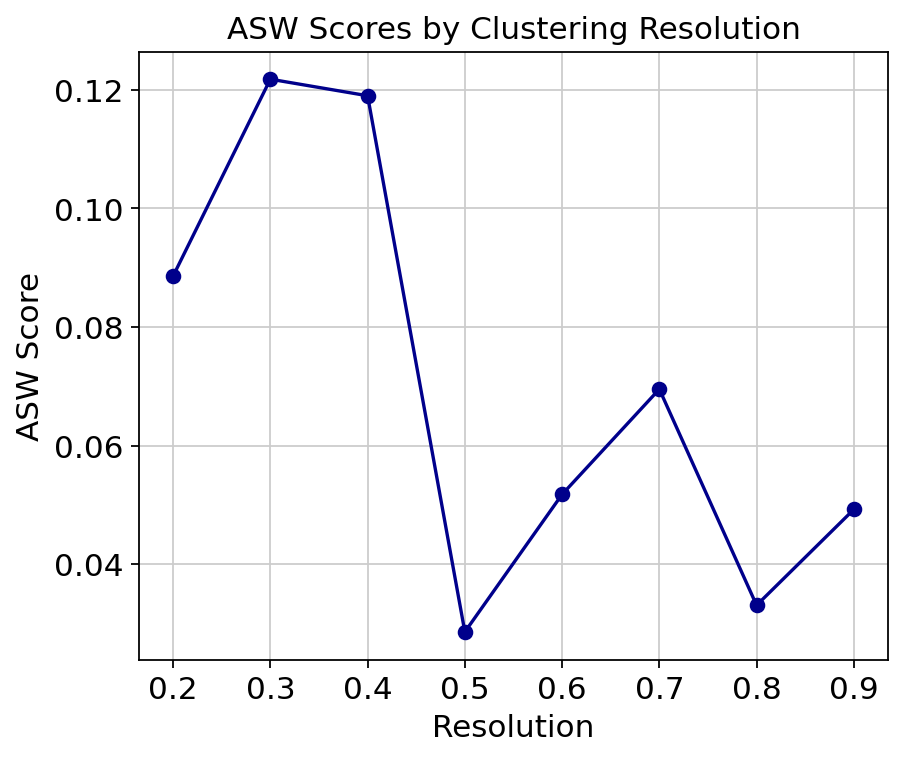

In [11]:
# Plot
sc.set_figure_params(scanpy=True, dpi=80, figsize=(6,5), dpi_save=400)
resolutions = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

plt.plot(resolutions, scores.values(), marker='o', color='darkblue')
plt.title("ASW Scores by Clustering Resolution")
plt.xlabel("Resolution")
plt.ylabel("ASW Score")
plt.savefig('/project/data/gew123/Spatial/Manual_Annotation/Final_figures/asw_plot_final.png')
plt.show()

In [44]:
# Function to get best clustering resolution
def get_best_resolution(scores_dict):
    for key,val in scores_dict.items():
        if val==max(scores_dict.values()):
            return key

'leiden_0.3'

In [14]:
sc.tl.leiden(adata, key_added=f'leiden_0.3', resolution=0.3)

In [11]:
# Save
adata.write('/project/data/gew123/Spatial/Annotated_objects/spatial_manual_annotation_inprogress.h5ad')

In [ ]:
# Plot best resolution
sc.settings.figdir = '/project/data/gew123/Spatial/Manual_Annotation/Final_figures'
sc.set_figure_params(scanpy=True, dpi=100, figsize=(5,4), dpi_save=400)
colors = sns.color_palette('husl', 9)

best_resolution = get_best_resolution(scores)
sc.pl.umap(adata, color=best_resolution, palette = colors, save='spatial_clustered_umap.png')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


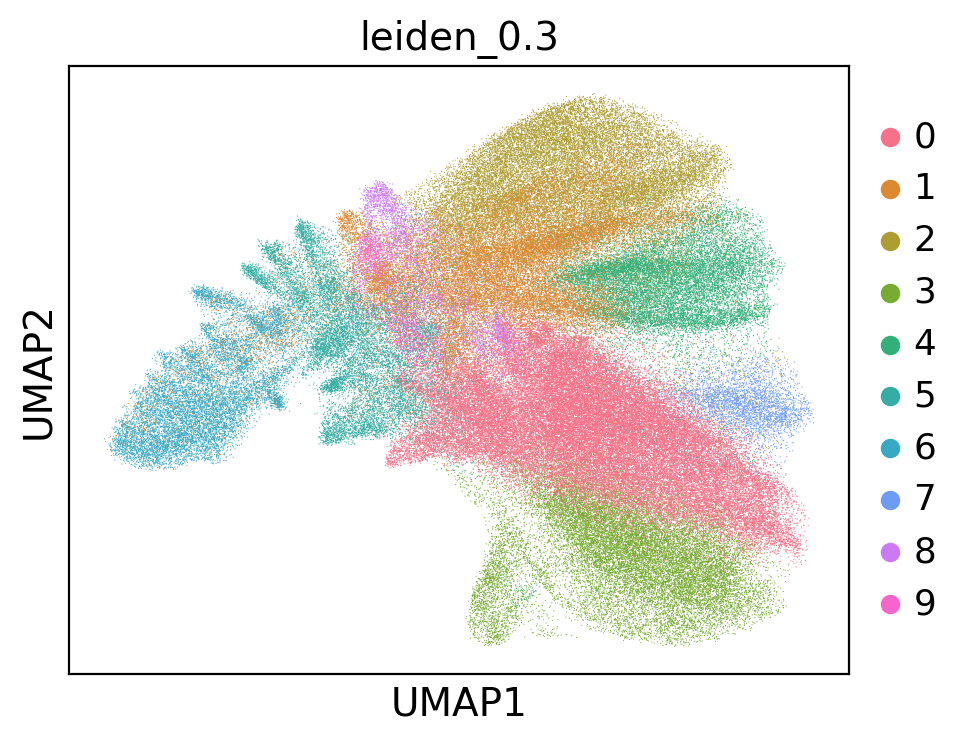

In [57]:
sc.settings.figdir = '/project/data/gew123/Spatial/Manual_Annotation/Final_figures'
colors = sns.color_palette('husl', 10)
sc.pl.umap(adata, color='leiden_0.3', palette = colors, frameon=True, save='spatial_clustered_umap_noborder.png')

In [82]:
sc.pp.calculate_qc_metrics(adata, qc_vars=["NegPrb"], inplace=True)

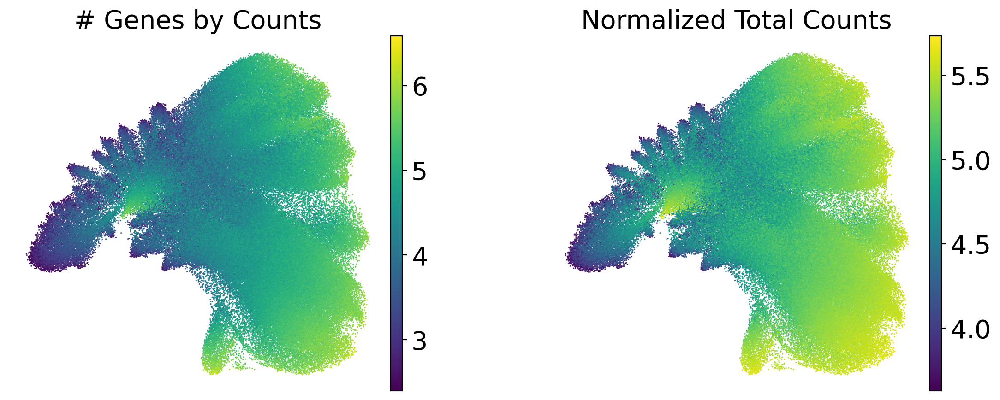

In [104]:
sc.set_figure_params(dpi=100, dpi_save=400, figsize=(5,5), fontsize=20)

sc.pl.umap(adata, color=['log1p_n_genes_by_counts', 'log1p_total_counts'], 
           title=['# Genes by Counts', 'Normalized Total Counts'],
           size=5, wspace=0.3, frameon=False,
           save='_spatial_count_metrics.png')

Clean up object

In [ ]:
for i in resolutions:
    if i != 0.3:
        del adata.obs[f'leiden_{i}']

In [12]:
adata

AnnData object with n_obs × n_vars = 182735 × 1000
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'tissue', 'section', 'subtype', 'stage', 'cell_ID', 'fine_annotations', 'broad_annotations', 'cat_annotations', 'leiden_30_0.7', 'leiden_0.3'
    var: 'NegPrb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'c2l_predicted_colors', 'fine_annotations_colors', 'grouped_annotations_colors', 'leiden', 'leiden_30_0.7_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'tissue_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_fov'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [ ]:
adata.write('/project/data/gew123/Spatial/Annotated_objects/spatial_manual_annotation_inprogress.h5ad')

## Manual Annotation

#### DEGs

In [5]:
sc.set_figure_params(dpi_save=400)

In [3]:
def perform_de(adata, grouping, name):
    #calculate total genes
    total_genes = adata.shape[1]

    #calculate marker genes
    sc.tl.rank_genes_groups(adata, groupby=grouping,method='wilcoxon', key_added='rank_genes', n_genes = total_genes)
    sc.tl.filter_rank_genes_groups(adata, key = 'rank_genes', groupby=grouping)
    sc.pl.rank_genes_groups(adata, key='rank_genes', fontsize=12, save='spatial_ranked_degs_plots.png')

    sc.pl.rank_genes_groups_dotplot(adata, key='rank_genes_groups_filtered') #save = "spatial_deg_dotplot_ + "_" + name, n_genes=5)
    de  = pd.DataFrame({'genes':[],'logfoldchanges':[],'pvals':[],'cluster':[]})
    for group in set(adata.obs[grouping]):
        d = {'genes': adata.uns['rank_genes']['names'][group],\
         'logfoldchanges': adata.uns['rank_genes']['logfoldchanges'][group],\
         'pvals':adata.uns['rank_genes']['pvals'][group],\
         'pvals_adj':adata.uns['rank_genes']['pvals_adj'][group],\
         'cluster':group}
        de = pd.concat([de,pd.DataFrame(d)])

    de  = pd.DataFrame({'genes':[],'logfoldchanges':[],'pvals':[],'cluster':[]})
    for group in set(adata.obs[grouping]):
        d = {'genes': adata.uns['rank_genes_groups_filtered']['names'][group],\
         'logfoldchanges': adata.uns['rank_genes_groups_filtered']['logfoldchanges'][group],\
         'pvals':adata.uns['rank_genes_groups_filtered']['pvals'][group],\
         'pvals_adj':adata.uns['rank_genes_groups_filtered']['pvals_adj'][group],\
         'cluster':group}
        de = pd.concat([de,pd.DataFrame(d)])

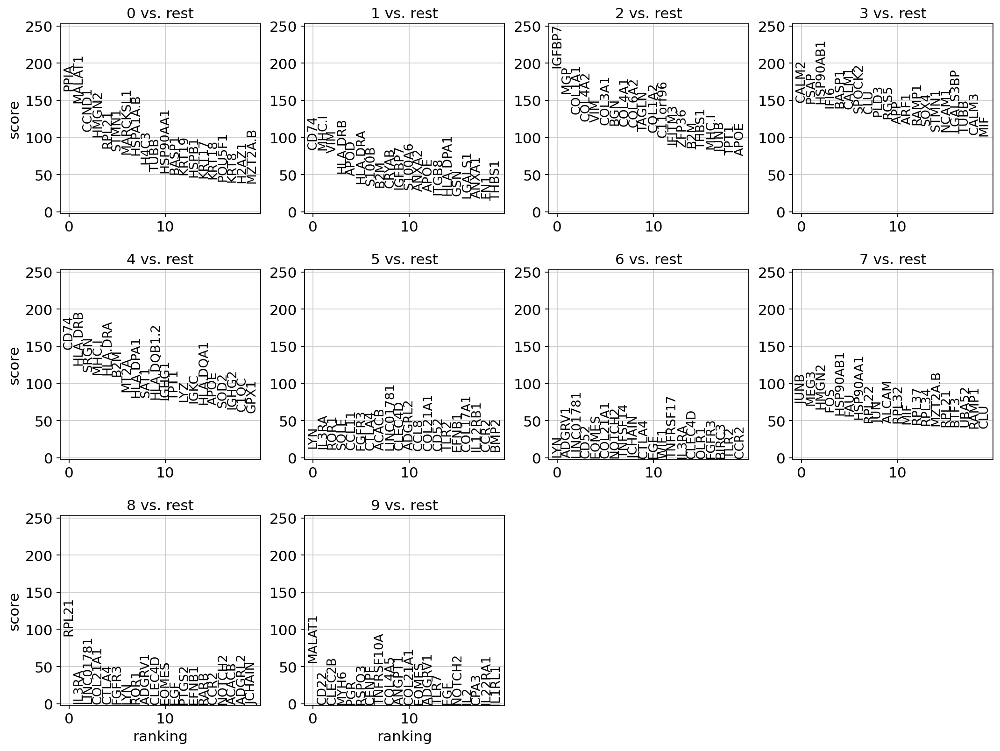

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


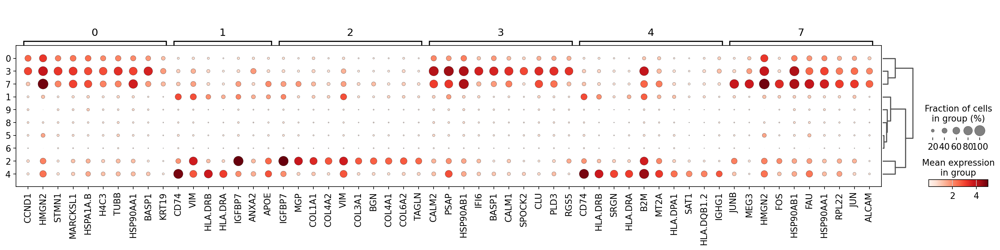

In [6]:
perform_de(adata, 'leiden_0.3', 'DEGs')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


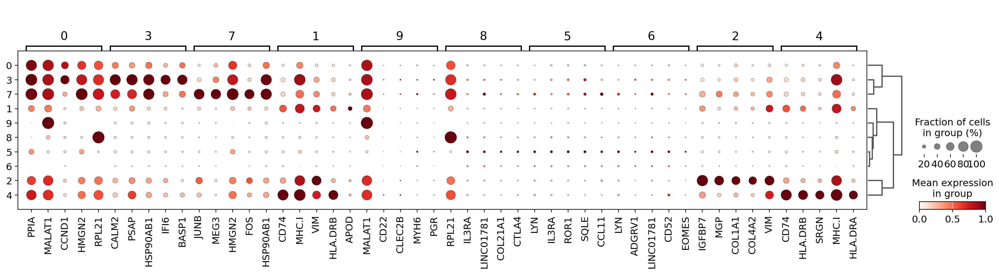

In [17]:
# Supplement annotation by dot plot of cluster DEGS
sc.settings.figdir = '/project/data/gew123/Spatial/Final_figures/annotation_manual'

# Calculate DEGs
sc.tl.rank_genes_groups(
    adata, groupby="leiden_0.3", method="wilcoxon", key_added="dea_leiden_0.3"
)

# Visualize dot plot
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_0.3", standard_scale="var", n_genes=5, key="dea_leiden_0.3",
    save='spatial_manual_deg_dotplot.png'
)

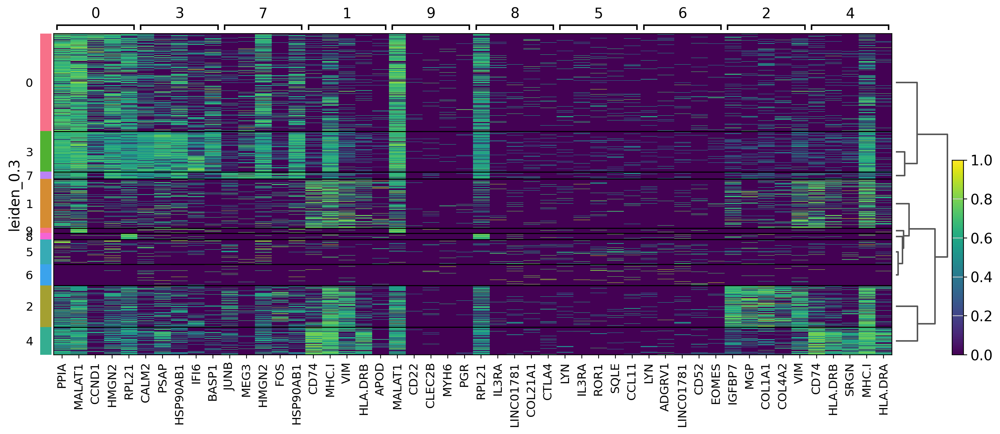

In [19]:
# Visualize DEGs as heat map
sc.pl.rank_genes_groups_heatmap(
    adata, groupby="leiden_0.3", standard_scale="var", n_genes=5, key="dea_leiden_0.3",
    save='spatial_manual_deg_heatmap.png'
)

In [27]:
# Access the results stored in 'uns' attribute
degs_results = adata.uns['dea_leiden_0.3']

# Convert and sort
clusters = list(adata.obs['leiden_0.3'].unique())
for index, i in enumerate(clusters):
    clusters[index] = int(i)
clusters.sort()

for i in clusters:
    # Get top 5 genes
    print(f'Cluster {i}:', list(degs_results['names'][f'{i}'][:5]))

Cluster 0: ['PPIA', 'MALAT1', 'CCND1', 'HMGN2', 'RPL21']
Cluster 1: ['CD74', 'MHC.I', 'VIM', 'HLA.DRB', 'APOD']
Cluster 2: ['IGFBP7', 'MGP', 'COL1A1', 'COL4A2', 'VIM']
Cluster 3: ['CALM2', 'PSAP', 'HSP90AB1', 'IFI6', 'BASP1']
Cluster 4: ['CD74', 'HLA.DRB', 'SRGN', 'MHC.I', 'HLA.DRA']
Cluster 5: ['LYN', 'IL3RA', 'ROR1', 'SQLE', 'CCL11']
Cluster 6: ['LYN', 'ADGRV1', 'LINC01781', 'CD52', 'EOMES']
Cluster 7: ['JUNB', 'MEG3', 'HMGN2', 'FOS', 'HSP90AB1']
Cluster 8: ['RPL21', 'IL3RA', 'LINC01781', 'COL21A1', 'CTLA4']
Cluster 9: ['MALAT1', 'CD22', 'CLEC2B', 'MYH6', 'PGR']


In [146]:
# Broad annotations - after DEGs only
broad_annotations = {
    '0': 'Tumor', # CCND1 (cell cycle, Fuste 2016), MALAT1 (tumor invasion, Rezaei 2021)
    '1': 'Immune', # CD74, HLA-DRB
    '2': 'Mesenchymal', # IGFBP7, COL1A1 (mesenchymal)
    '3': 'Tumor', # BASP1, CALM2
    '4': 'Immune', # CD74
    '5': 'Unclear cell type',
    '6': 'Unclear cell type',
    '7': 'Sympathoadrenal', # MEG3, JUNB
    '8': 'Unclear cell type',
    '9': 'Tumor & Immune' # MALAT1, CD22 (B cells, )
}

# After looking at manual gene plots
broad_annotations_final = {
    '0': 'ADRN', # CCND1 (cell cycle, Fuste 2016), MALAT1 (tumor invasion, Rezaei 2021)
    '1': 'Mixed cell types', # CD74, HLA-DRB
    '2': 'MES', # IGFBP7, COL1A1 (mesenchymal)
    '3': 'ADRN', # BASP1, CALM2
    '4': 'IMMUNE', # CD74
    '5': 'Mixed cell types',
    '6': 'Mixed cell types',
    '7': 'ADRN', # MEG3, JUNB
    '8': 'Mixed cell types',
    '9': 'Mixed cell types' # MALAT1, CD22 (B cells, )
}


In [147]:
# Set annotations
adata.obs['manual_annotations'] = adata.obs["leiden_0.3"].map(broad_annotations_final)


In [5]:
adata.obs

,fov,Area,AspectRatio,CenterX_global_px,CenterY_global_px,Width,Height,Mean.MembraneStain,Max.MembraneStain,Mean.PanCK,...,tissue,section,subtype,stage,cell_ID,fine_annotations,broad_annotations,cat_annotations,leiden_0.3,manual_labels
3_1,1,10996,2.06,95170.997899,99963.034702,183,89,52,4561,37,...,tissue_01,E4,differentiating neuroblastoma,1_2,3,Mast cells,Myeloid cells,Immune,5,Mixed cell types
5_1,1,9341,0.82,95468.997899,99760.034702,102,124,332,2770,341,...,tissue_01,E4,differentiating neuroblastoma,1_2,5,Endothelial cells,Endothelial,Endothelial,2,MES
6_1,1,4901,1.26,95379.997899,99721.034702,92,73,340,692,867,...,tissue_01,E4,differentiating neuroblastoma,1_2,6,Mesenchymal cells,Mesenchymal,Mesenchymal,2,MES
7_1,1,8042,0.76,95249.997899,99688.034702,93,123,380,1287,618,...,tissue_01,E4,differentiating neuroblastoma,1_2,7,Mast cells,Myeloid cells,Immune,6,Mixed cell types
8_1,1,3137,0.72,95412.997899,99681.034702,63,87,569,1201,915,...,tissue_01,E4,differentiating neuroblastoma,1_2,8,Endothelial cells,Endothelial,Endothelial,0,ADRN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471_202,202,4170,0.92,81967.003876,56219.283252,82,89,2288,14766,404,...,tissue_13,D3,neuroblastoma,4,471,Helper (CD4+) T cells,T cells,Immune,2,MES
473_202,202,4561,1.39,82186.003876,56182.283252,97,70,3171,17822,511,...,tissue_13,D3,neuroblastoma,4,473,Macrophages/monocytes,Myeloid cells,Immune,4,IMMUNE
474_202,202,6188,1.43,82094.003876,56138.283252,109,76,3346,16071,405,...,tissue_13,D3,neuroblastoma,4,474,Myofibroblasts,Myofibroblasts,Myofibroblasts,2,MES
475_202,202,4717,1.08,81896.003876,56118.283252,81,75,2092,13187,438,...,tissue_13,D3,neuroblastoma,4,475,SCPs,SCPs,SCPs,2,MES


/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


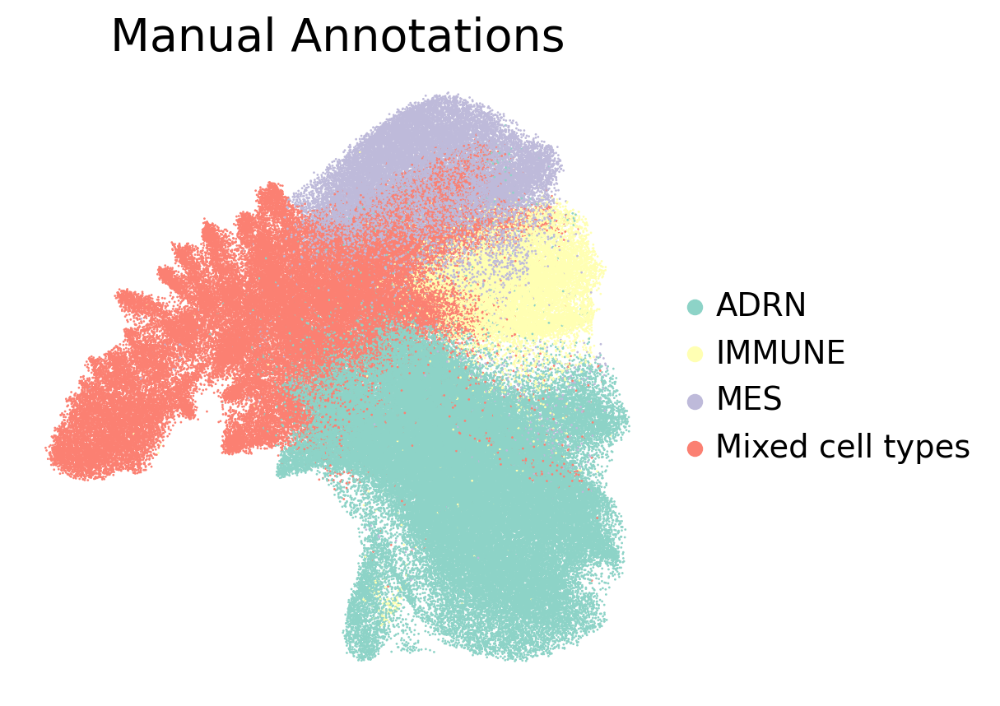

In [15]:
colors2 = sns.color_palette('Set3', 4)
sc.set_figure_params(dpi=100, dpi_save=400, figsize=(5,5), fontsize=20)


sc.pl.umap(adata, color='manual_labels', palette=colors2, size=4, title='Manual Annotations', frameon=False, legend_fontsize='x-small',
           save='_spatial_manual_annotations.png')

In [157]:
adata_final = sc.read_h5ad('/project/data/gew123/Spatial/Annotated_objects/spatial_annotated_final.h5ad')

In [158]:
# Transfer clusterings and annotations
adata_final.obs['leiden_0.3'] = adata.obs['leiden_0.3']
adata_final.obs['manual_labels'] = adata.obs['manual_annotations']

In [166]:
adata_final.uns['dea_leiden_0.3'] = adata.uns['dea_leiden_0.3']
adata_final.layers['log_counts'] = adata.layers['log_counts'].copy()

In [167]:
adata_final.write('/project/data/gew123/Spatial/Annotated_objects/spatial_annotated_final.h5ad')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


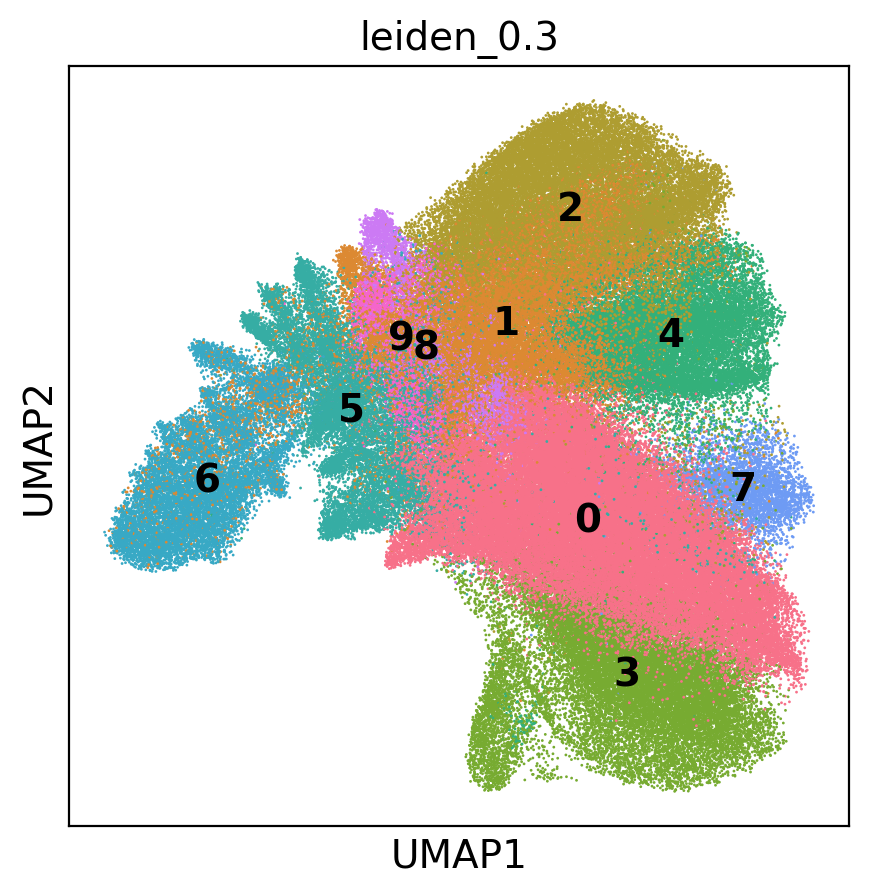

In [118]:
sc.set_figure_params(figsize=(5,5), dpi=100)
sc.pl.umap(adata, color='leiden_0.3', size=4, legend_loc='on data')

#### Marker genes

In [36]:
# Normalize
scaled_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
# log1p transform
adata.layers["log_counts"] = sc.pp.log1p(scaled_counts["X"], copy=True)

In [38]:
adata.X = adata.layers['log_counts']

NB markers

Mesenchymal :


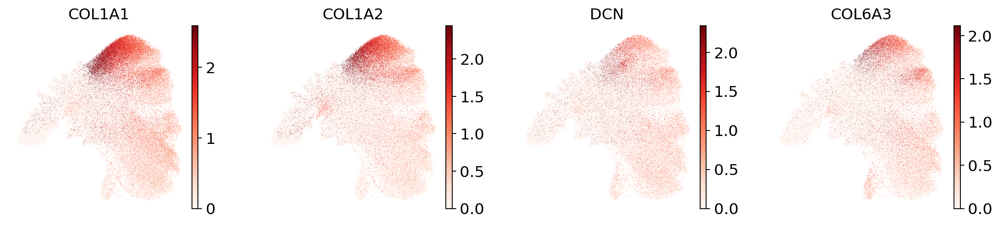

In [71]:
sc.set_figure_params(figsize=(3,3))

# General NB markers
nb_markers = {'Endothelial': ['FLT1', 'PECAM1', 'TIE1'],
 'Mesenchymal': ['COL1A1', 'COL1A2', 'DCN', 'COL6A3'],
 'Myofibroblasts': ['ACTA2', 'TAGLN'],
 'Neuroblasts': ['SOX4', 'TOP2A', 'GATA3', 'CCND1'],
 'SCPs': ['ERBB3', 'MKI67', 'CDH19'],
 'Chromaffin': ['TOP2A']
 }

# Plot
for cell, markers in nb_markers.items():
    # Plot unique markers in RED
    print(cell, ':')
    sc.pl.umap(
        adata,
        color=markers,
        vmin=0,
        vmax="p99", 
        sort_order=False,  
        frameon=False,
        cmap="Reds",
        save=f'_spatial_{cell}.png')

T_cells :


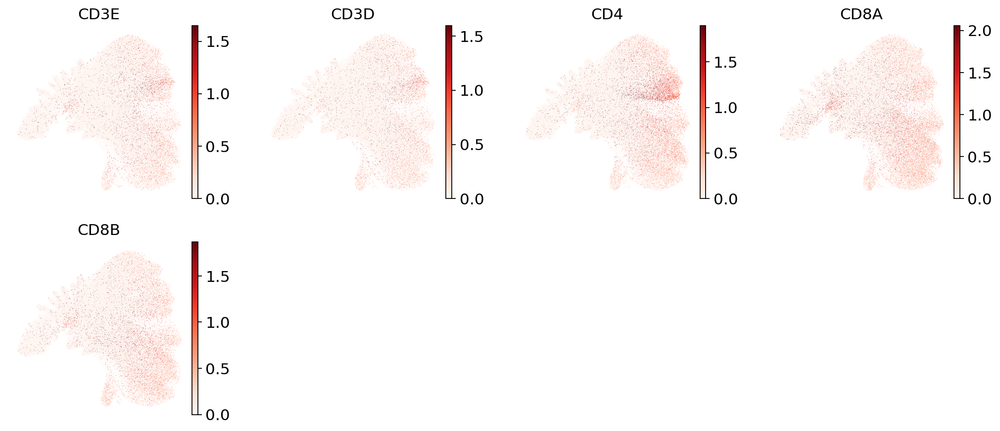

B_cells :


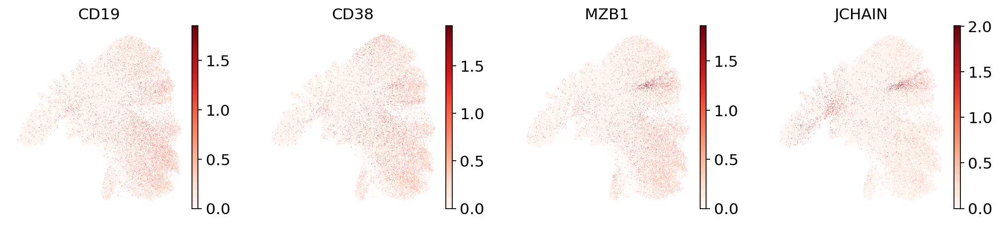

Myeloid :


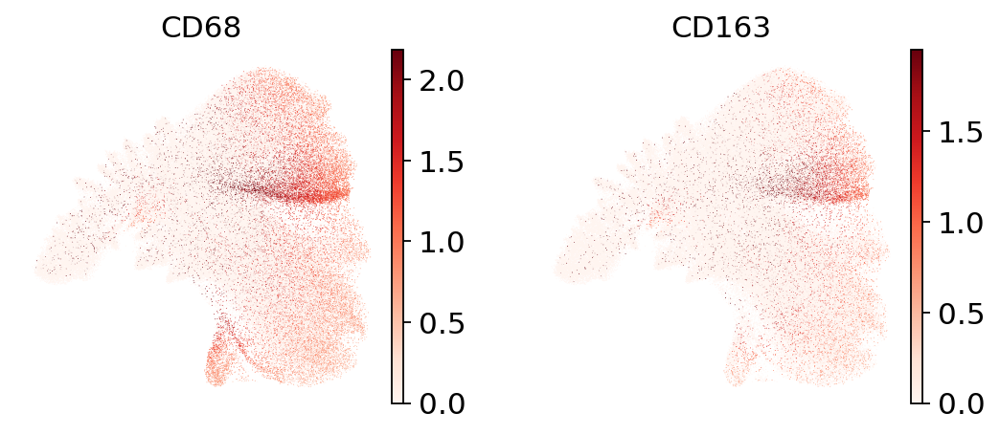

In [111]:
sc.set_figure_params(figsize=(3,3))

# Broad cell type markers
immune_markers = {'T_cells': ['CD3E', 'CD3D', 'CD4', 'CD8A', 'CD8B'],
                 'B_cells': ['CD19', 'CD38', 'MZB1', 'JCHAIN'],
                 'Myeloid': ['CD68', 'CD163']
}

# Plot
for cell, markers in immune_markers.items():
    # Plot unique markers in RED
    print(cell, ':')
    sc.pl.umap(
        adata,
        color=markers,
        vmin=0,
        vmax="p99", 
        sort_order=False,  
        frameon=False,
        cmap="Reds",
        save=f'_spatial_{cell}.png')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


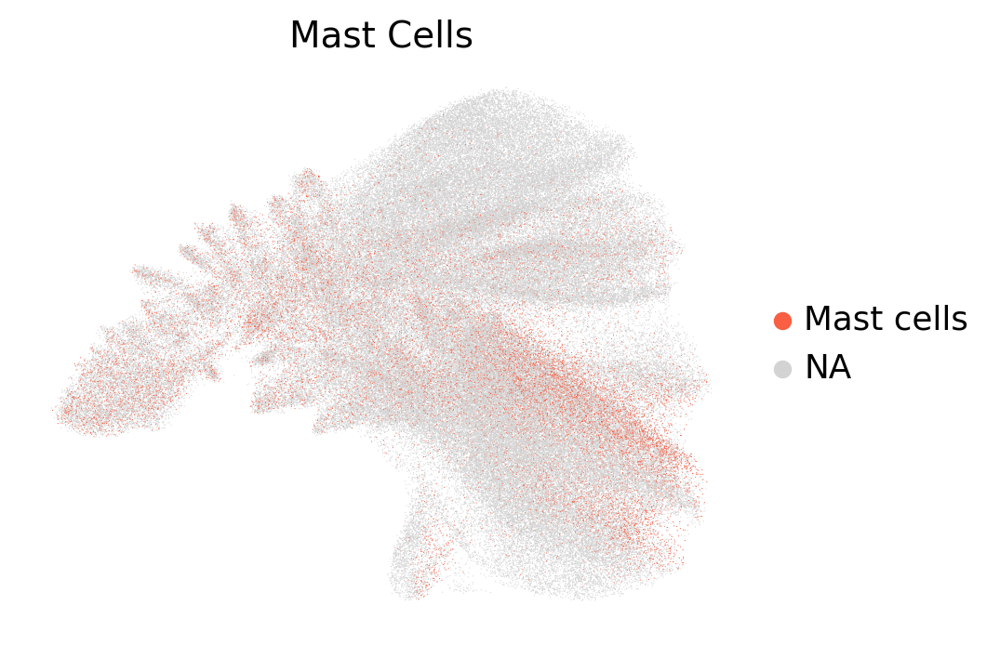

In [65]:
# Plot a particular cell type
sc.pl.umap(
    adata,
    color='fine_annotations', groups='Mast cells', title='Mast Cells',
    vmin=0,
    vmax="p99", 
    sort_order=False,  
    frameon=False,
    palette='Reds', save='mast_cell_distribution.png')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


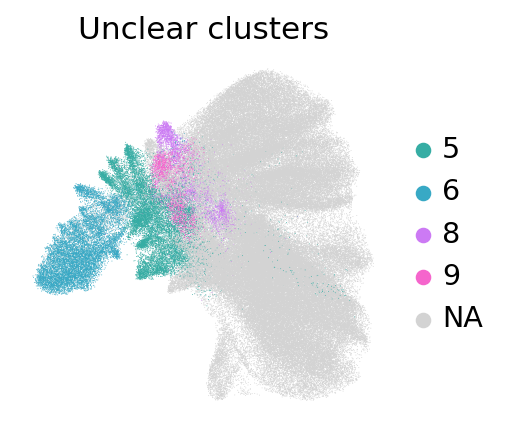

In [74]:
# Plot unclear clusters
sc.pl.umap(
    adata,
    color='leiden_0.3', groups=['5', '6', '8', '9'], title='Unclear clusters',
    vmin=0,
    vmax="p99", 
    sort_order=False,  
    frameon=False,
    palette=colors, save='_spatial_unclear_clusters.png')

Getting matrix plot of cells per cluster

In [ ]:
# exact number of cells
cells_per_cluster_per_tissue = pd.crosstab(adata.obs['leiden_0.3'], adata.obs['tissue'])
cells_per_cluster_per_tissue

Looking at individual gene expression in FOVs

In [ ]:
sq.pl.spatial_segment(
    adata,
    color="CD56", # NB marker
    library_key="fov",
    library_id=["79", "80", "82", "83"],
    seg_cell_id="cell_ID",
    seg_outline=True,
)

sq.pl.spatial_segment(
    adata,
    color="NCAM", # NB marker
    library_key="fov",
    library_id=["79", "80", "82", "83"],
    seg_cell_id="cell_ID",
    seg_outline=True,
)